In [1]:
!nvidia-smi

Fri Feb  7 10:12:36 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 430.26       Driver Version: 430.26       CUDA Version: 10.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  GeForce RTX 208...  Off  | 00000000:1D:00.0 Off |                  N/A |
| 27%   26C    P8    12W / 250W |     10MiB / 11019MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
|   1  GeForce RTX 208...  Off  | 00000000:1E:00.0 Off |                  N/A |
| 27%   24C    P8     5W / 250W |     10MiB / 11019MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
|   2  G

In [4]:
import os
os.environ["CUDA_DEVICE_ORDER"]="PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]="5"

import numpy as np
import matplotlib.pyplot as plt

import sys
sys.path.append('/mnt/disk1/project/SMhospital/capsule/ce_packages')

from ce_utils import load_data, one_hot, test_batch_idxs
from ce_utils import model_prob
from ce_model import binary_model, ensemble_model

/usr/local/lib/python3.5/dist-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.5/dist-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.5/dist-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.5/dist-packages/tensorflow/python/framework/dtypes.py:519: FutureWarning: Passing (type, 1) or 

In [6]:
load_data?

In [18]:
load_data?

In [36]:
import glob
import cv2

def load_data(phase, cls, les = None, data = 'sm', data_dir = '/mnt/disk2/data/private_data/SMhospital/capsule/1 preprocessed', 
              extract_name = False, image_ch = 'bgr'):
    """
    phase = 'train', 'test'
    cls: [les]  
      'n': ['neg']
      'h': ['redspot', 'angio', 'active'], 
      'd': ['ero', 'ulc', 'str'],
      'p': ['amp', 'lym', 'tum']}
    """
    lesions = dict(neg = 'negative', 
                   redspot = 'red_spot', angio = 'angioectasia', active = 'active_bleeding', 
                   ero = 'erosion', ulcer = 'ulcer', str = 'stricture', 
                   amp = 'ampulla_of_vater', lym = 'lymphoid_follicles', tum = 'small_bowel_tumor')
    classes = dict(n = 'negative', h = 'hemorrhagic', d = 'depressed', p = 'protruded')

    path = os.path.join(data_dir, data, phase, classes[cls], lesions[les])
    pathlist = glob.glob(path + '/*.jpg')
    new_pathlist = []
    for p in pathlist:
        name = os.path.basename(p)
        name_seg1 = name.split('___')[0]
        if not ('f_' in name_seg1 or 'r1_' in name_seg1 or 'r2_' in name_seg1 or 'r3_' in name_seg1):
            new_pathlist.append(p)
    return load_image_from_path(sorted(new_pathlist), image_ch = image_ch, extract_name = extract_name)

def load_image_from_path(pathlist,image_ch = 'bgr', extract_name = False):
    data = []
    for i in pathlist:
        temp = cv2.imread(i)
        if image_ch == 'bgr':
            pass
        elif image_ch == 'rgb':
            temp = cv2.cvtColor(temp, cv2.COLOR_BGR2RGB)
        elif image_ch == 'hsv':
            temp = cv2.cvtColor(temp, cv2.COLOR_BGR2HSV)
        data.append(temp)
    if extract_name != False:
        name = []
        for i in pathlist:
            name.append(os.path.basename(i))
        return np.asarray(data), np.asarray(name)
    else:
        return np.asarray(data) 

In [42]:
redspot_img, redspot_name = load_data('train', 'h', 'redspot', 'sm', extract_name=True, image_ch='rgb')
angio_img, angio_name = load_data('train', 'h', 'angio', 'sm', extract_name=True, image_ch='rgb')
# active_img, active_name = load_data('train', 'h', 'active', 'sm', extract_name=True, image_ch='rgb')
# ero_img, ero_name = load_data('train', 'd', 'ero', 'sm', extract_name=True, image_ch='rgb')
# ulcer_img, ulcer_name = load_data('train', 'd', 'ulcer', 'sm', extract_name=True, image_ch='rgb')
# str_img, str_name = load_data('train', 'd', 'str', 'sm', extract_name=True, image_ch='rgb')

redspot_label = one_hot(redspot_img, 1)
angio_label = one_hot(angio_img, 1)
# active_label = one_hot(active_img, 1)
# ero_label = one_hot(ero_img, 1)
# ulcer_label = one_hot(ulcer_img, 1)
# str_label = one_hot(str_img, 1)

print("red spot:",redspot_img.shape, redspot_label.shape)
print("angioectasia:",angio_img.shape, angio_label.shape)
# print("active_bleeding:",active_img.shape, active_label.shape)
# print("erosion:",ero_img.shape, ero_label.shape)
# print("ulcer:",ulcer_img.shape, ulcer_label.shape)
# print("stricture:",str_img.shape, str_label.shape)

red spot: (560, 512, 512, 3) (560, 2)
angioectasia: (19, 512, 512, 3) (19, 2)


In [12]:
model_dir = '/mnt/disk1/project/SMhospital/capsule/algorithm/1) ensemble/model/ENTIRE'

model_list = sorted([i[:-5] for i in os.listdir(model_dir) if 'meta' in i and 'rgb' in i ])

print('Models:\n')

for i in model_list:
    print(i)

nh_path = os.path.join(model_dir, model_list[2])
nd_path = os.path.join(model_dir, model_list[1])
b_path = os.path.join(model_dir, model_list[0])

Models:

ENTIRE_rgb_B_1908242109_8570_val_acc_1.00_val_loss_0.011026
ENTIRE_rgb_ND_1908302155_7140_val_acc_1.00_val_loss_0.002939
ENTIRE_rgb_NH_1908312018_5750_val_acc_1.00_val_loss_0.001598


In [14]:
NH_model = binary_model(nh_path) 
ND_model = binary_model(nd_path)
E_model = ensemble_model(nh_path, nd_path)
B_model = binary_model(b_path)

# Grad-CAM

In [15]:
featuremap_list = ['conv2d/Relu:0', 'conv2d_1/Relu:0', 'maxp1/MaxPool:0', 
                    'conv2d_2/Relu:0', 'conv2d_3/Relu:0', 'maxp2/MaxPool:0', 
                    'conv2d_4/Relu:0', 'conv2d_5/Relu:0', 'maxp3/MaxPool:0', 
                    'conv2d_6/Relu:0', 'conv2d_7/Relu:0', 'maxp4/MaxPool:0', 
                    'conv2d_8/Relu:0', 'conv2d_9/Relu:0', 'maxp5/MaxPool:0', 
                    'conv2d_10/Relu:0', 'conv2d_11/Relu:0', 'maxp6/MaxPool:0', 
                    'conv2d_12/Relu:0', 'conv2d_13/Relu:0', 'maxp7/MaxPool:0']

## Red spot

In [46]:
b_idxs = test_batch_idxs(redspot_img)

In [47]:
b_cams, nh_cams, nd_cams, e_cams = [], [], [], []
b_outputs, nh_outputs, nd_outputs = [], [], []

for b_idx in b_idxs:

    b_cam = B_model.get_gradcam(redspot_img[b_idx], featuremap_name='conv2d_11/Relu:0')
    nh_cam = NH_model.get_gradcam(redspot_img[b_idx], featuremap_name = 'conv2d_11/Relu:0')
    nd_cam = ND_model.get_gradcam(redspot_img[b_idx], featuremap_name = 'conv2d_11/Relu:0')
    e_cam = E_model.get_gradcam(redspot_img[b_idx], featuremap_name='conv2d_11/Relu:0')

    b_output = B_model.get_softmax(redspot_img[b_idx])
    _, nh_output, nd_output = E_model.get_softmax(redspot_img[b_idx])
    
    b_cams.append(b_cam), nh_cams.append(nh_cam), nd_cams.append(nh_cam), e_cams.append(e_cam)
    b_outputs.append(b_output), nh_outputs.append(nh_output), nd_outputs.append(nd_output)
    
b_cams, nh_cams, nd_cams, e_cams = np.concatenate(b_cams), np.concatenate(nh_cams), np.concatenate(nd_cams), np.concatenate(e_cams)
b_outputs, nh_outputs, nd_outputs = np.concatenate(b_outputs), np.concatenate(nh_outputs), np.concatenate(nd_outputs)

In [54]:
mK_list = [i for i, name in enumerate(redspot_name) if 'mK' in name]

In [55]:
mK_list

[204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216]

In [51]:
b_cams.shape

(560, 512, 512, 3)

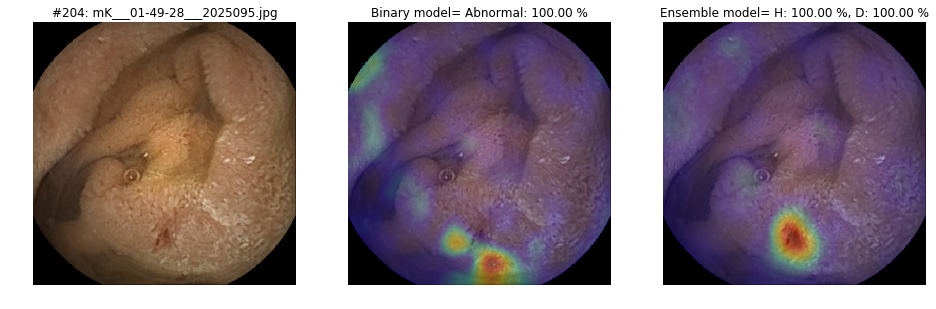

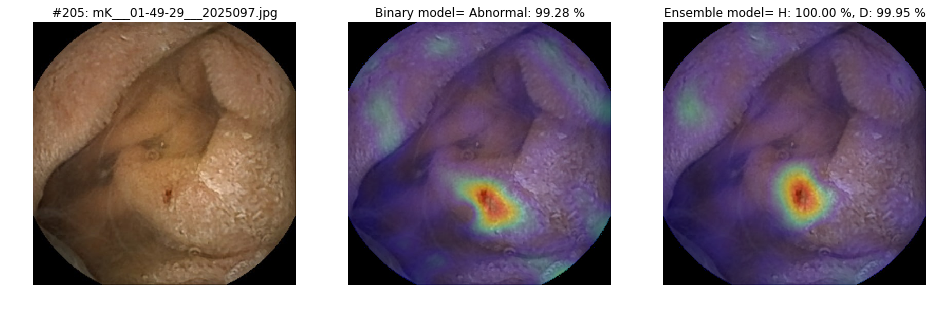

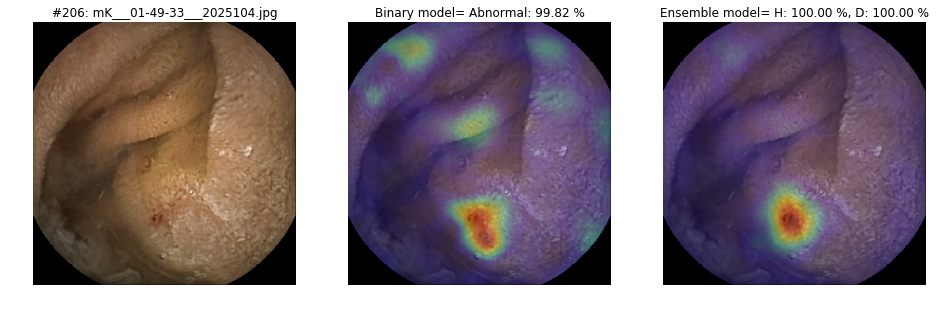

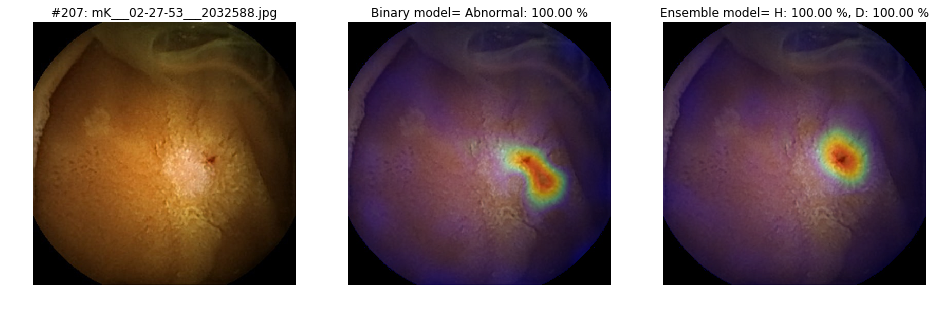

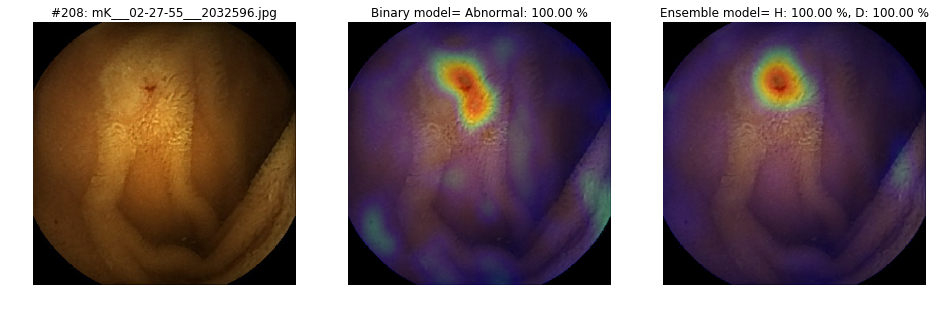

...

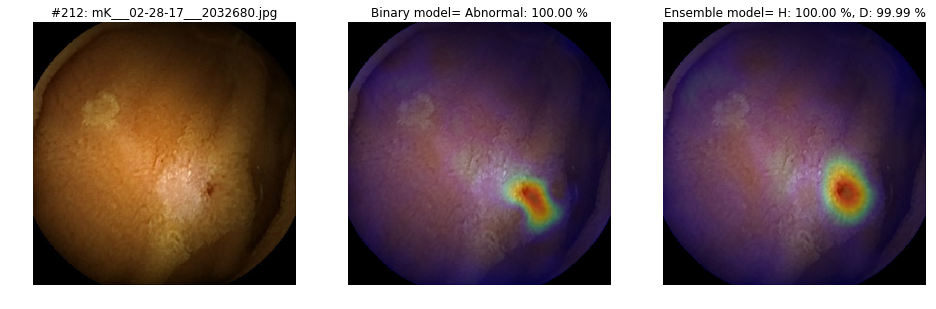

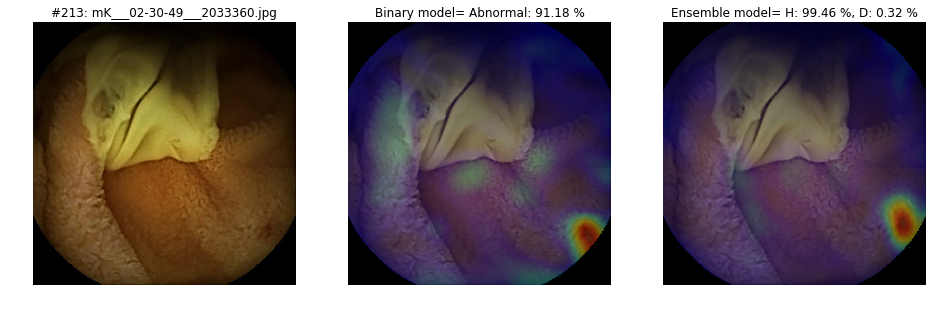

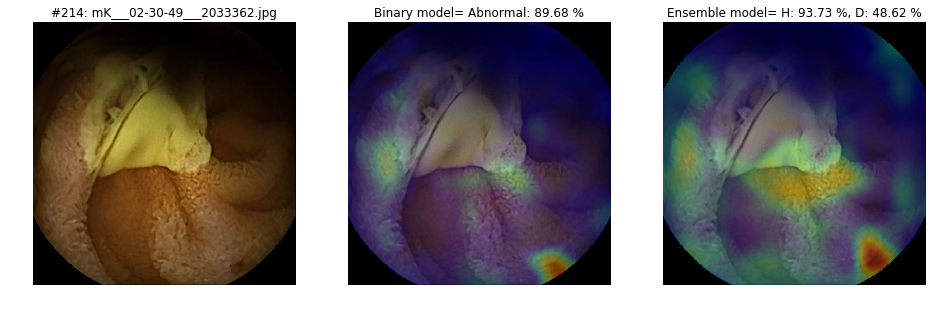

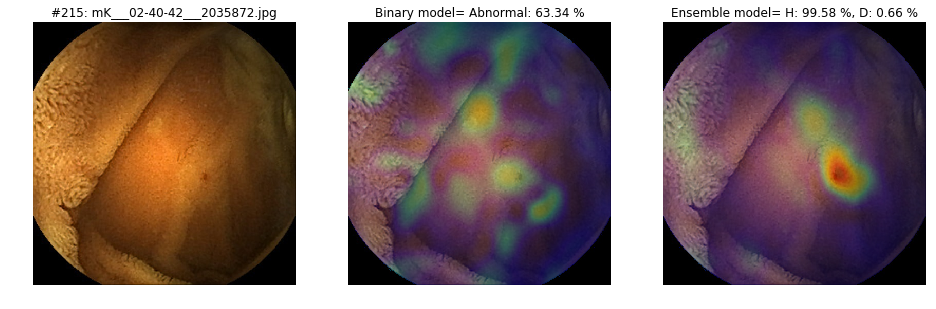

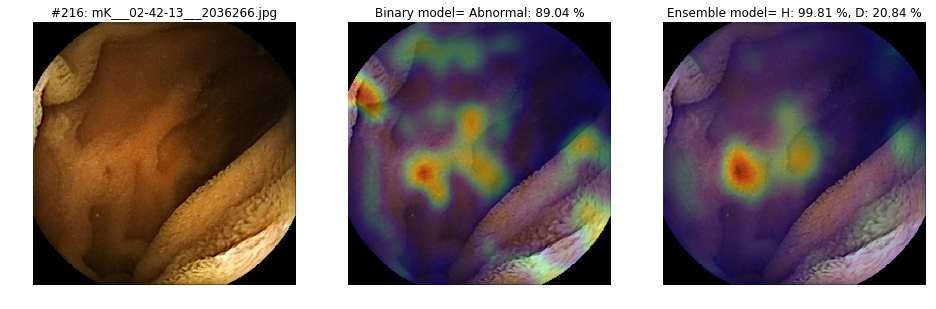

In [56]:
ran_idx = np.sort(np.random.choice(len(b_cams), 20, replace = False))

for i in mK_list:
    fig, axes = plt.subplots(1, 3, figsize = (16, 8))
    axes[0].set_title('#{}: {}'.format(i, redspot_name[i]))
    axes[0].imshow(redspot_img[i])
    axes[0].axis('off')
    axes[1].set_title('Binary model= Abnormal: {:.2f} %'.format(100*b_outputs[i, 1]))
    axes[1].imshow(redspot_img[i])
    axes[1].imshow(b_cams[i], alpha = 0.3)
    axes[1].axis('off')
    axes[2].set_title('Ensemble model= H: {:.2f} %, D: {:.2f} %'.format(100*nh_outputs[i, 1], 100*nd_outputs[i, 1]))
    axes[2].imshow(redspot_img[i])
    axes[2].imshow(e_cams[i], alpha = 0.3)
    axes[2].axis('off')

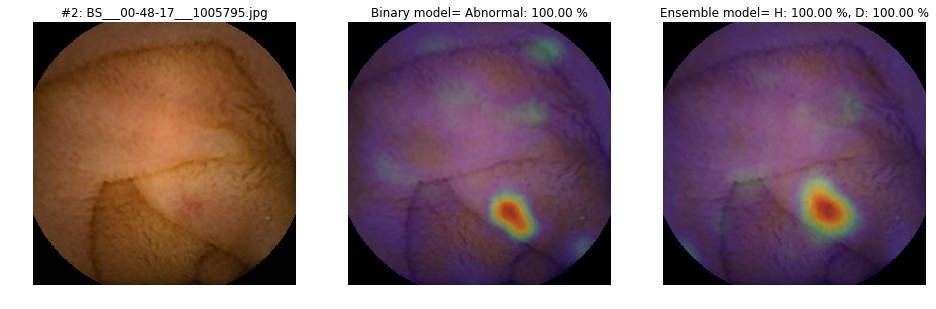

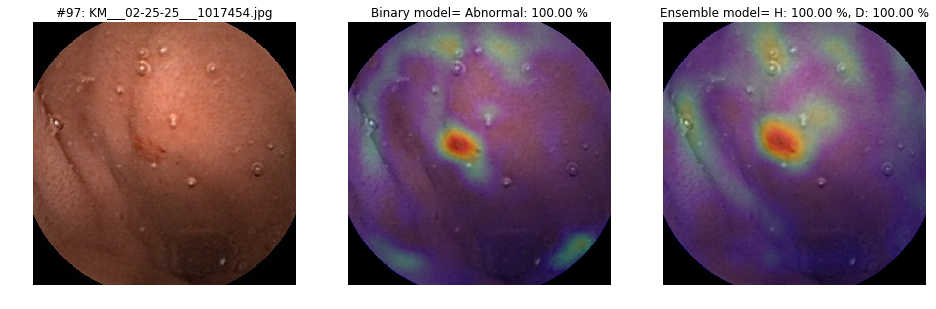

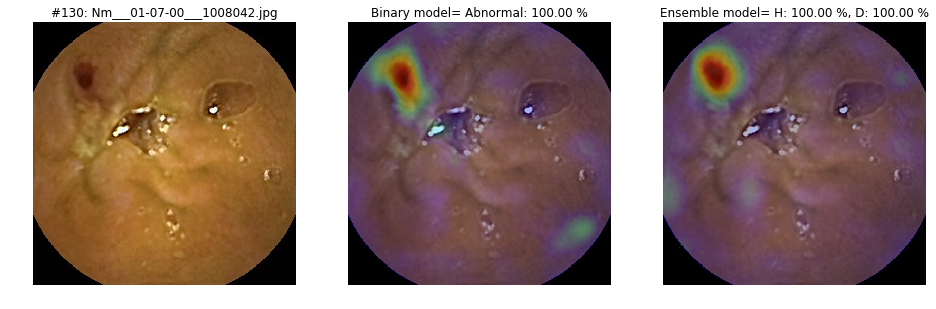

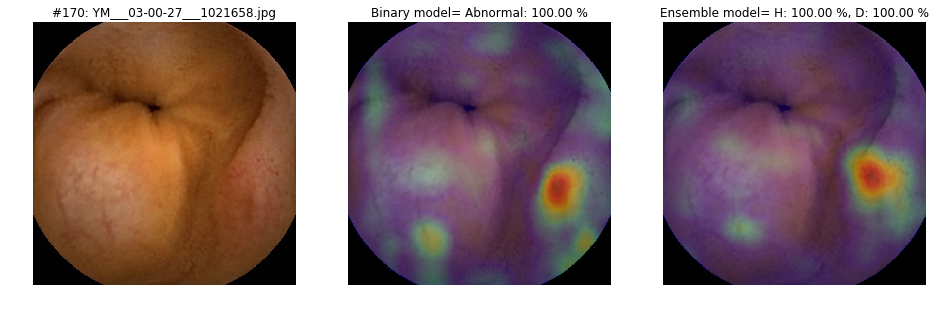

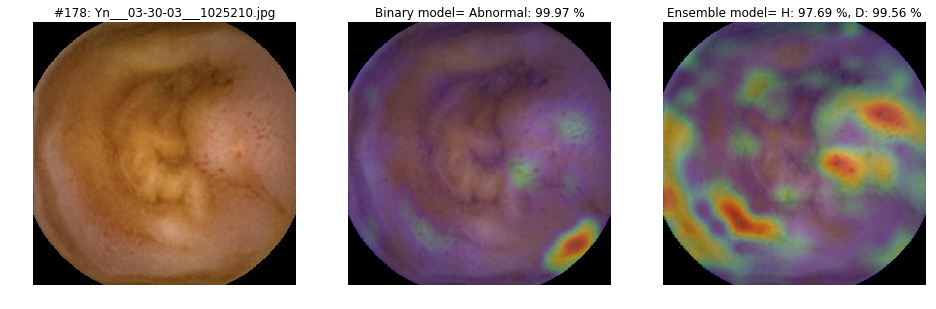

...

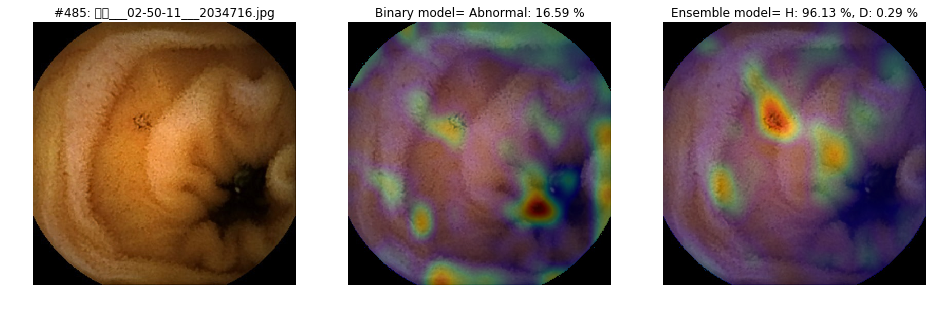

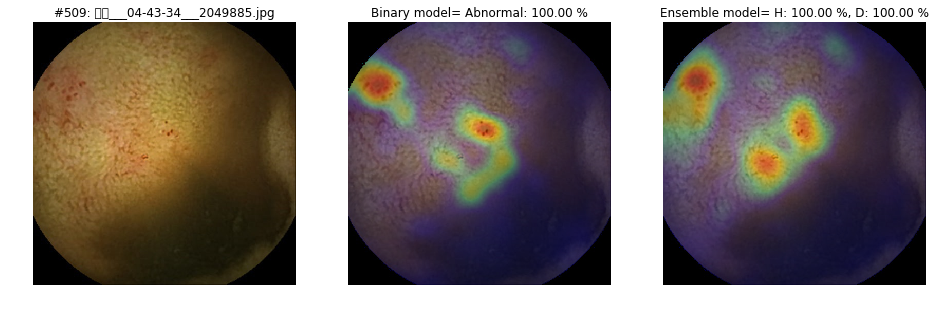

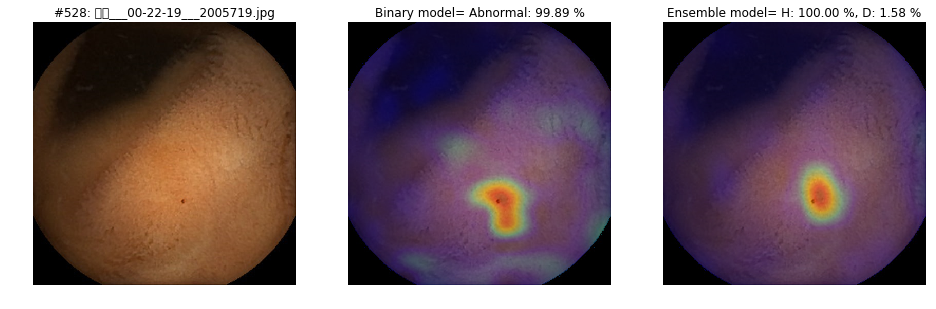

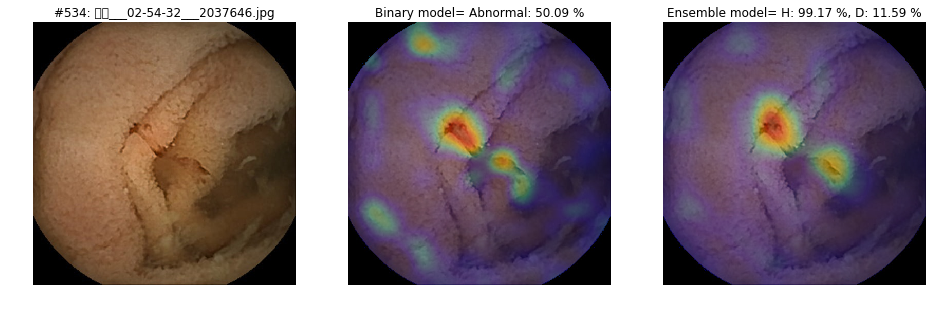

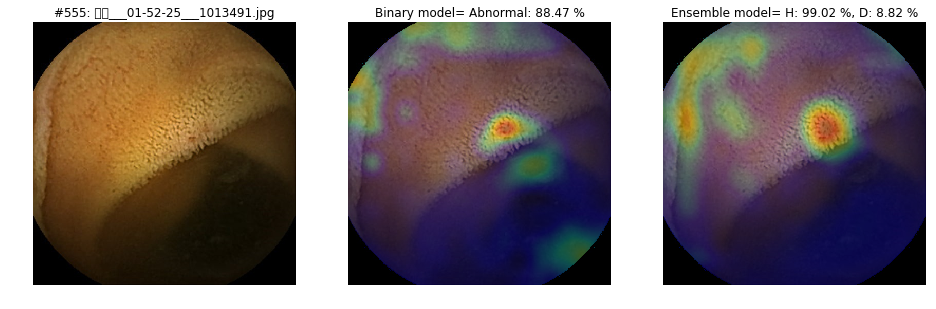

In [57]:
ran_idx = np.sort(np.random.choice(len(b_cams), 20, replace = False))

for i in ran_idx:
    fig, axes = plt.subplots(1, 3, figsize = (16, 8))
    axes[0].set_title('#{}: {}'.format(i, redspot_name[i]))
    axes[0].imshow(redspot_img[i])
    axes[0].axis('off')
    axes[1].set_title('Binary model= Abnormal: {:.2f} %'.format(100*b_outputs[i, 1]))
    axes[1].imshow(redspot_img[i])
    axes[1].imshow(b_cams[i], alpha = 0.3)
    axes[1].axis('off')
    axes[2].set_title('Ensemble model= H: {:.2f} %, D: {:.2f} %'.format(100*nh_outputs[i, 1], 100*nd_outputs[i, 1]))
    axes[2].imshow(redspot_img[i])
    axes[2].imshow(e_cams[i], alpha = 0.3)
    axes[2].axis('off')

## Angioectasia

In [59]:
b_cam = B_model.get_gradcam(angio_img, featuremap_name='conv2d_11/Relu:0')
nh_cam = NH_model.get_gradcam(angio_img, featuremap_name = 'conv2d_11/Relu:0')
nd_cam = ND_model.get_gradcam(angio_img, featuremap_name = 'conv2d_11/Relu:0')
e_cam = E_model.get_gradcam(angio_img, featuremap_name='conv2d_11/Relu:0')

b_output = B_model.get_softmax(angio_img)
_, nh_output, nd_output = E_model.get_softmax(angio_img)

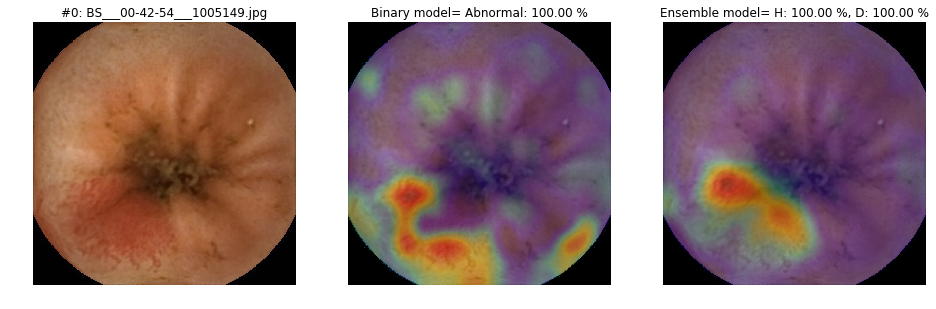

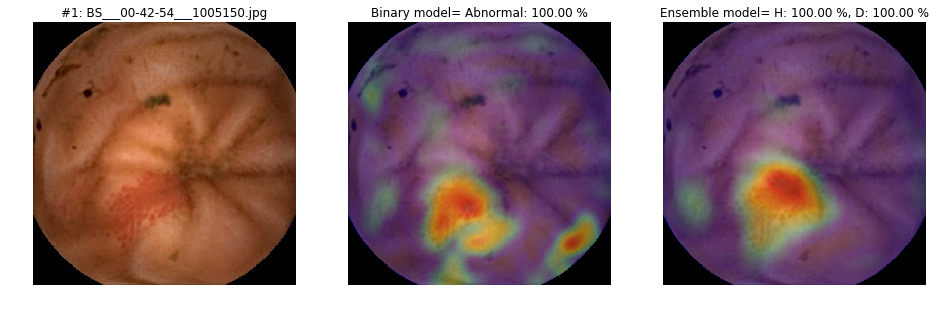

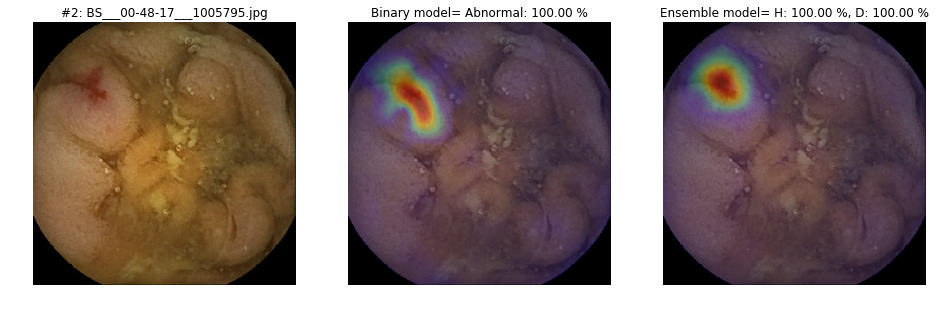

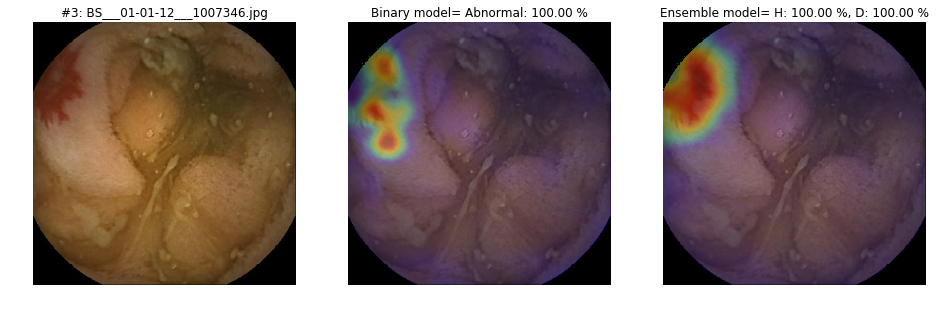

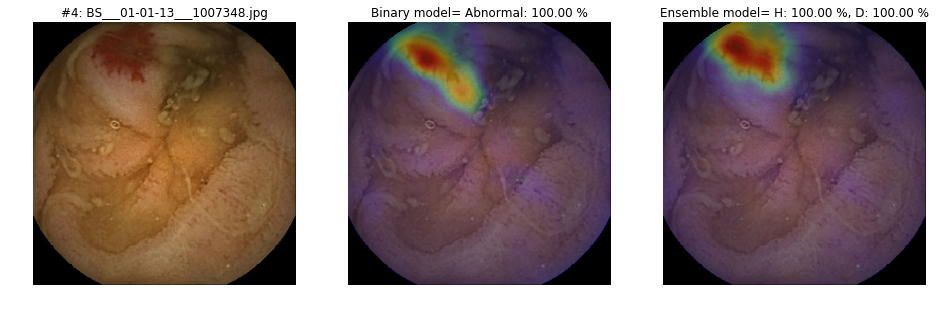

...

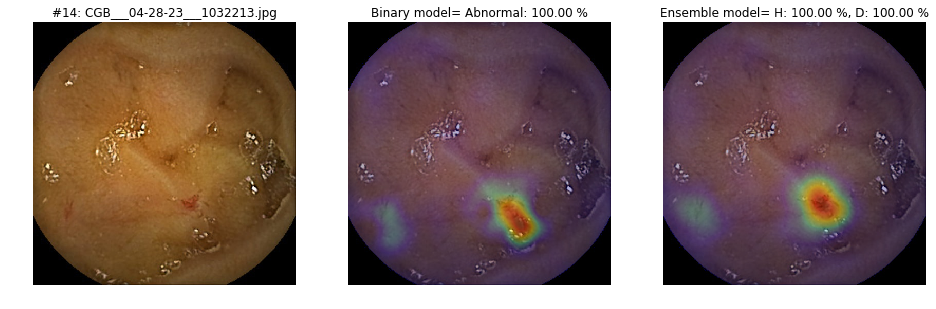

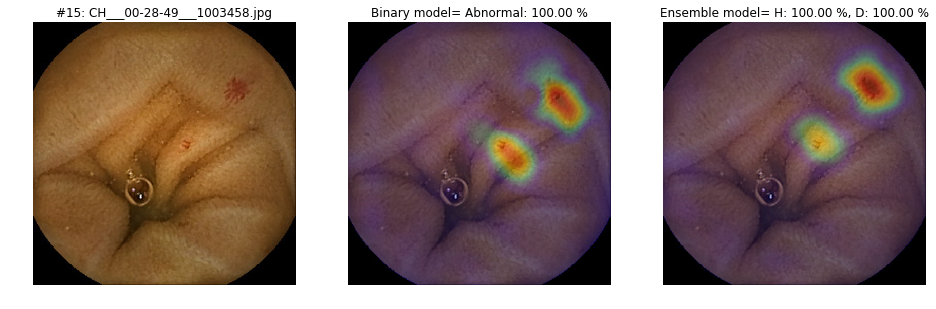

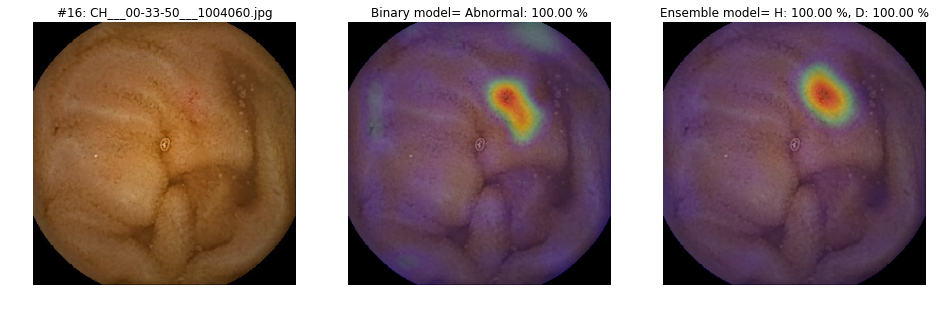

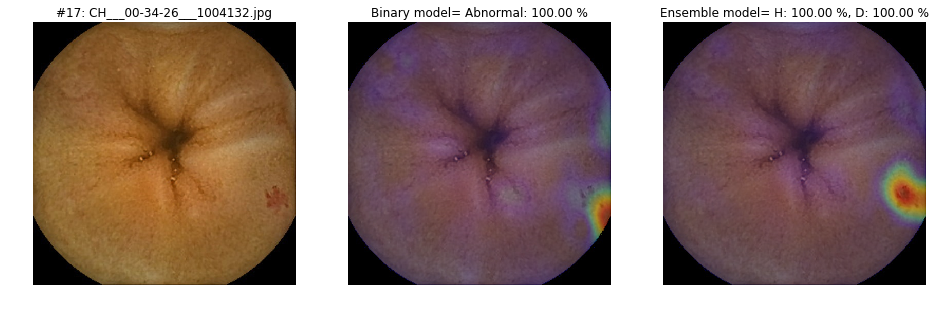

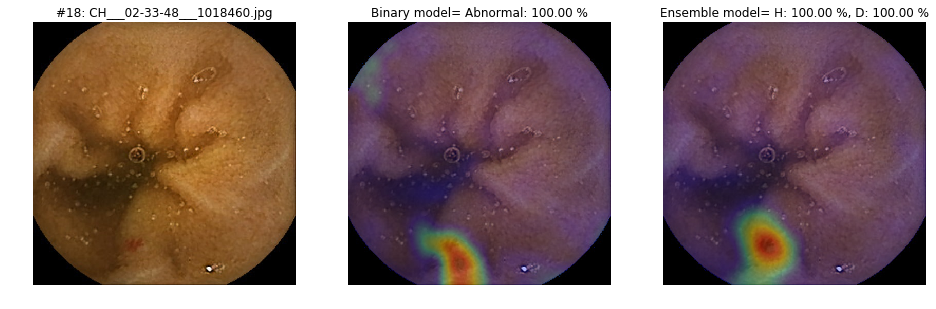

In [44]:
for i in range(len(angio_img)):
    fig, axes = plt.subplots(1, 3, figsize = (16, 8))
    axes[0].set_title('#{}: {}'.format(i, redspot_name[i]))
    axes[0].imshow(angio_img[i])
    axes[0].axis('off')
    axes[1].set_title('Binary model= Abnormal: {:.2f} %'.format(100*b_output[i, 1]))
    axes[1].imshow(angio_img[i])
    axes[1].imshow(b_cam[i], alpha = 0.3)
    axes[1].axis('off')
    axes[2].set_title('Ensemble model= H: {:.2f} %, D: {:.2f} %'.format(100*nh_output[i, 1], 100*nd_output[i, 1]))
    axes[2].imshow(angio_img[i])
    axes[2].imshow(e_cam[i], alpha = 0.3)
    axes[2].axis('off')

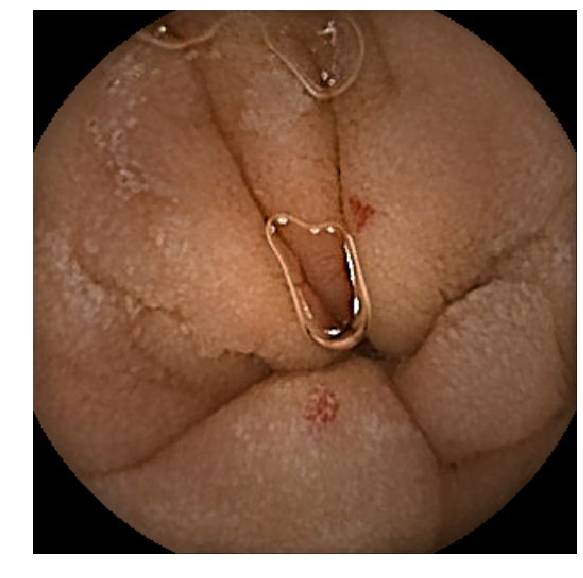

In [68]:
awesome = [7]

for i in awesome:
    fig = plt.figure(figsize = (10, 10))
    plt.imshow(angio_img[i])
#     plt.imshow(nd_cam[i], alpha = 0.3)
    plt.axis('off')
    fig.savefig('./angio_{}_{}.png'.format(i, angio_name[i].split('.jpg')[0]),  bbox_inches='tight', dpi = 300)